#  Showing notes using fft

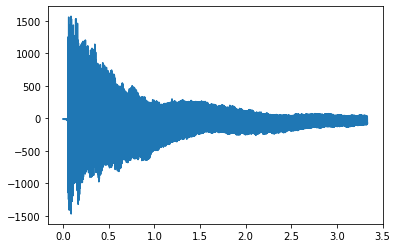

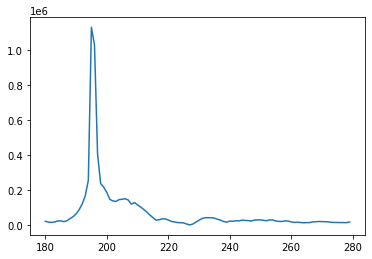

Max fft value at 195 Hz!


In [4]:
from IPython.display import Audio
import matplotlib.pyplot as plt
from scipy.io import wavfile
import numpy as np
import math

def show_sound_fft(sound, rate, fft_range=(150,1600)): 
    seconds = sound.shape[0]/rate
    
    plt.plot(np.linspace(0, seconds, len(sound[:])), sound[:])
    plt.show()
    
    display(Audio(sound, rate=rate))

    x = np.array(range(fft_range[0], fft_range[1]))
    fft_voice = np.absolute(np.fft.fft(sound[:]))

    plt.plot(x, fft_voice[(x*seconds).astype(int)])
    plt.show()
    
    print('Max fft value at {} Hz!'.format(x[np.argmax(fft_voice[(x*seconds).astype(int)])]))

# 'piano', 'violin'
rate, sound = wavfile.read('sounds/piano-G3.wav')
show_sound_fft(sound, rate, fft_range=(180,280))


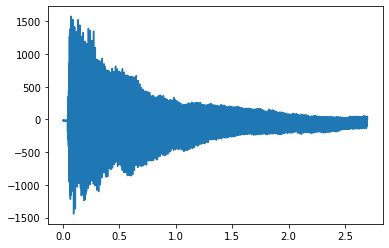

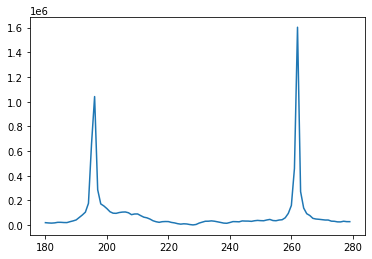

Max fft value at 262 Hz!


In [6]:
from IPython.display import Audio
import matplotlib.pyplot as plt
from scipy.io import wavfile
import numpy as np
import math

def sum_sound(sound1, sound2, rate1, rate2, w):
    if rate1!= rate2: raise Exception('Rates must match!')

    if sound1.shape[0]<sound2.shape[0]:
        return w*sound1 + (1-w)*sound2[:sound1.shape[0]]
    else:
        return w*sound1[:sound2.shape[0]] + (1-w)*sound2

rate1, sound1 = wavfile.read('sounds/piano-G3.wav')
rate2, sound2 = wavfile.read('sounds/piano-C4.wav')

sound = sum_sound(sound1, sound2, rate1, rate2, w=0.7)
show_sound_fft(sound, rate2, fft_range=(180,280))


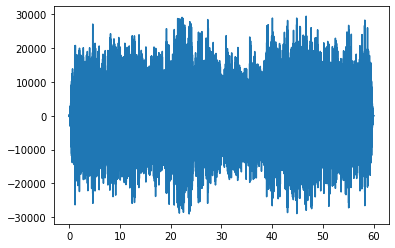

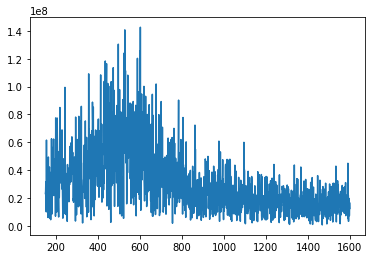

Max fft value at 602 Hz!


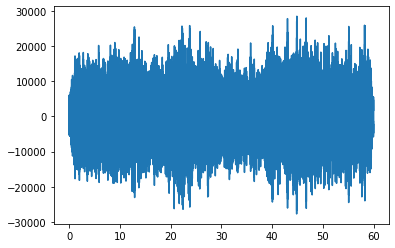

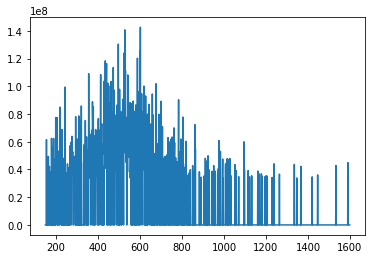

Max fft value at 602 Hz!


In [7]:
def cancel_noise(data, rate, percent, use_fft):
    data = data.astype(np.complex64)
    if use_fft: data[:] = np.fft.fft(data[:])
    weak_points = np.where(np.absolute(data[:]) < np.quantile(np.absolute(data[:]), 1-percent))
    data[weak_points] = 0 
    if use_fft: data[:] = np.fft.ifft(data[:])
    return np.real(data), rate

rate, data = wavfile.read('sounds/crowd.wav')
data = data[:,0]
show_sound_fft(data, rate)
data, rate = cancel_noise(data, rate, 0.02, use_fft=True)
show_sound_fft(data, rate)


#  Compressing images using fft

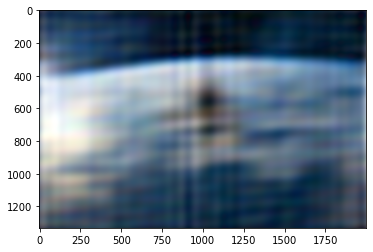

In [16]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def compress(file, percent, use_fft):
    color_img = np.array(Image.open(file), dtype=np.complex64)/255
    
    for c in range(3):
        if use_fft: color_img[...,c] = np.fft.fft(color_img[...,c], axis=0)
        if use_fft: color_img[...,c] = np.fft.fft(color_img[...,c], axis=1)
        weak_points = np.where(np.absolute(color_img[...,c]) < np.quantile(np.absolute(color_img[...,c]), 1-percent))
        color_img[weak_points[0],weak_points[1],c] = 0
        if use_fft: color_img[...,c] = np.fft.ifft(color_img[...,c], axis=1)
        if use_fft: color_img[...,c] = np.fft.ifft(color_img[...,c], axis=0)
            
    color_img = np.absolute(color_img)
    color_img = np.maximum(color_img, 0)
    color_img = np.minimum(color_img, 1)
    plt.imshow(color_img)
    plt.show()

compress('images/astronaut.jpg', 0.0001, use_fft=True)

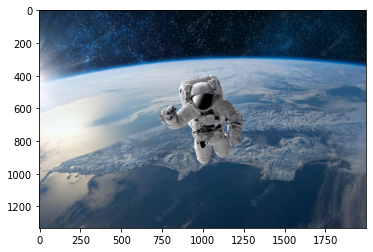

In [11]:
plt.imshow(np.array(Image.open('images/astronaut.jpg')))